# Shelf Detection 

          
            
## Set up 

In [1]:
import cv2
import numpy as np
from pylab import rcParams
import matplotlib.pyplot as plt

%matplotlib inline

Plot given data

In [2]:
def plot_data(dataset):
    
    plt.figure(figsize=(100, 100))
    for i in range(len(dataset)):
        plt.subplot(1, 6, i+1)
        plt.imshow(dataset[i], cmap='gray')
        plt.xticks([])
        plt.yticks([])
    
plt.tight_layout()
plt.show()

<Figure size 432x288 with 0 Axes>

In [3]:
def plot_keypoints(dataset):
    plt.figure(figsize=(50, 50))
    for i in range(len(dataset)):
        plt.subplot(6, 1, i+1)
        plt.imshow(dataset[i][0])
        plt.xticks([])
        plt.yticks([])
    
plt.tight_layout()
plt.show()

<Figure size 432x288 with 0 Axes>

The function below load item images

In [4]:
def load_items():
    items = []
    #items.append(cv2.imread('dataset/items/1.jpg', cv2.IMREAD_GRAYSCALE))
    #items.append(cv2.imread('dataset/items/2.jpg', cv2.IMREAD_GRAYSCALE))
    #items.append(cv2.imread('dataset/items/3.jpg', cv2.IMREAD_GRAYSCALE))
    #items.append(cv2.imread('dataset/items/4.jpg', cv2.IMREAD_GRAYSCALE))
    #items.append(cv2.imread('dataset/items/5.jpg', cv2.IMREAD_GRAYSCALE))
    items.append(cv2.imread('dataset/items/6.jpg', cv2.IMREAD_GRAYSCALE))   
    return items

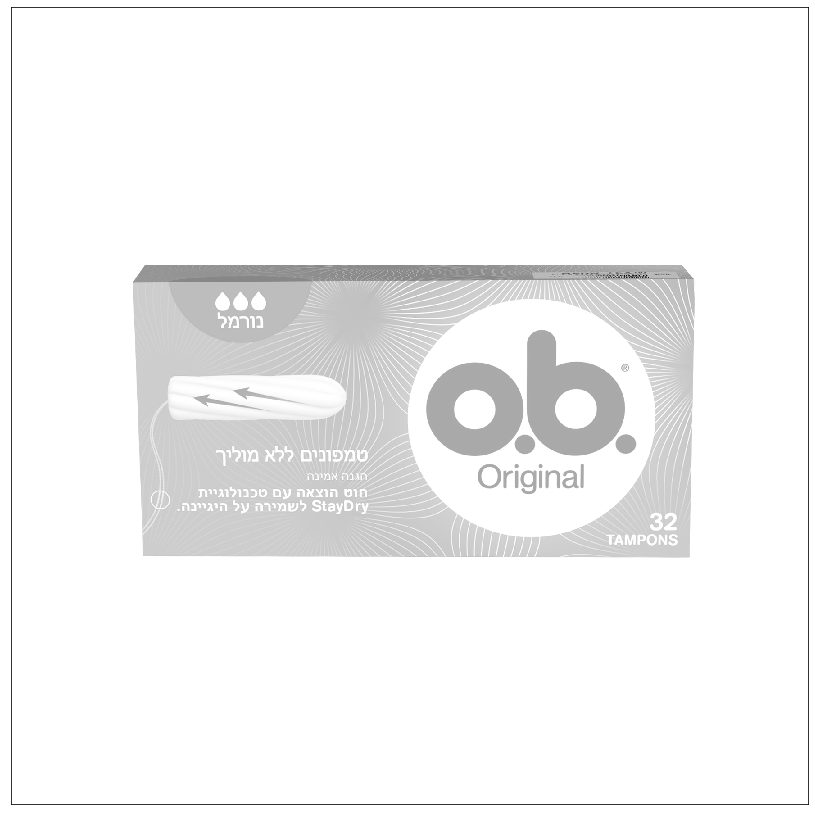

In [5]:
items = load_items()
plot_data(items)

## Get Descriptors
Create SIFS

In [6]:
sift = cv2.xfeatures2d.SIFT_create()

Run over the items list and get keypoint and descriptor. 

● item_info - (image with keypoints, keypoints, descriptors)

In [7]:
items_keypoint = []
for i in range(len(items)):
    
    keypoints, descriptors = sift.detectAndCompute(items[i], None)
    item = cv2.drawKeypoints(items[i], keypoints, None)
    
    item_info = (item, keypoints, descriptors)
    items_keypoint.append(item_info)
    
    print('Item #' + str(i + 1))

Item #1


Dispaly all the keypoint

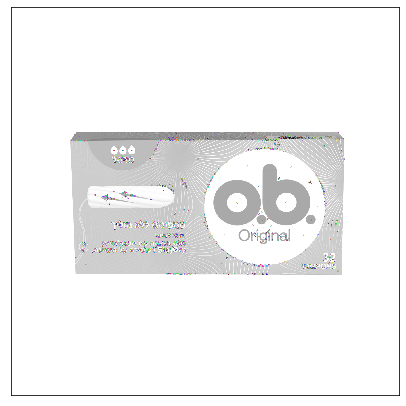

In [8]:
plot_keypoints(items_keypoint)

Dispaly one shelfs for example, with O.B item.

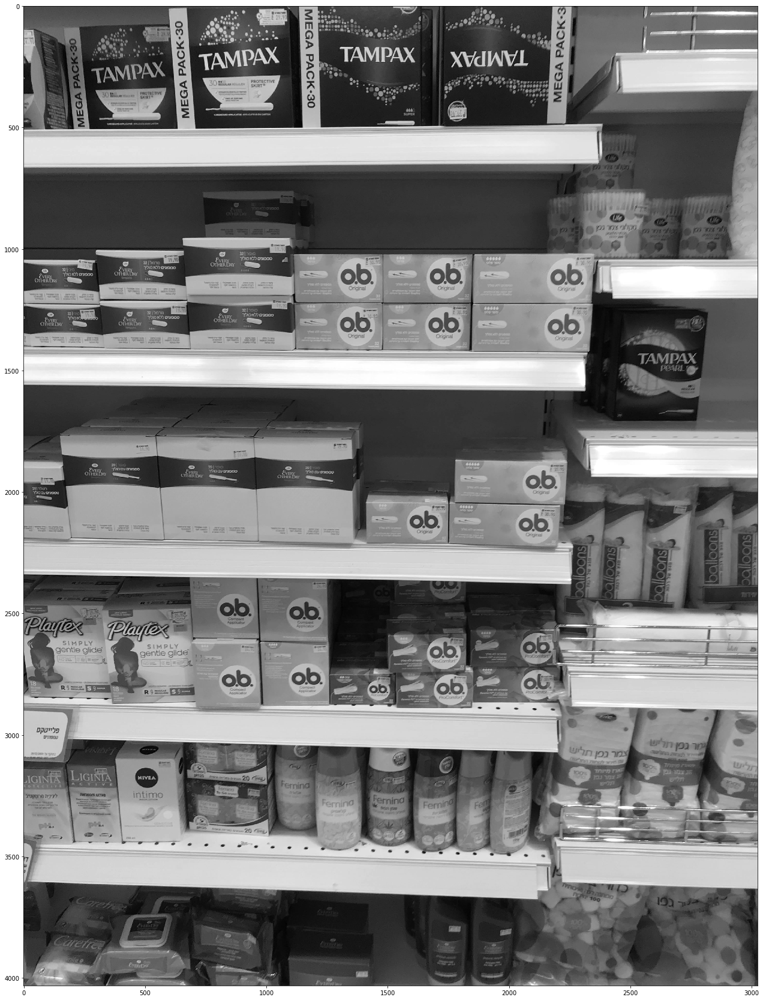

In [9]:
rcParams['figure.figsize'] = 30, 30
shelfs = cv2.imread('dataset/shelfs/7.jpg', cv2.IMREAD_GRAYSCALE)
shelfs_color = cv2.imread('dataset/shelfs/7.jpg')
plt.imshow(shelfs, cmap='gray')

 Get Descriptors for the shelfs in the same way

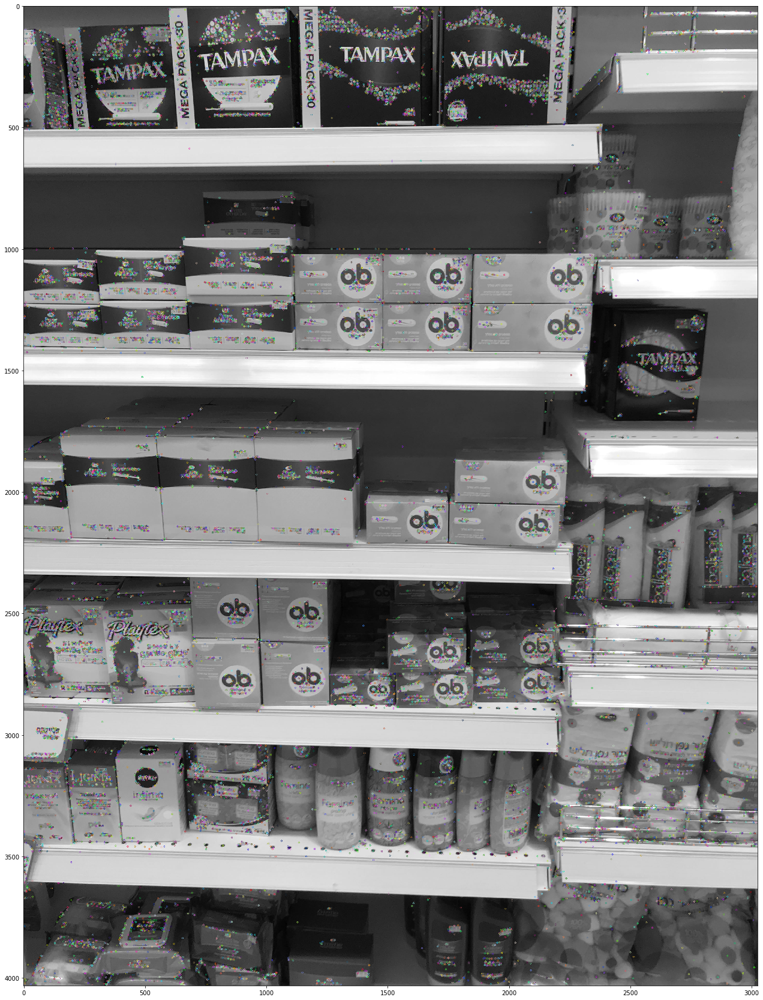

In [10]:
shelfs_keypoints, shelfs_descriptors = sift.detectAndCompute(shelfs, None)
shelfs = cv2.drawKeypoints(shelfs, shelfs_keypoints, None)
plt.imshow(shelfs, cmap='gray')

## FLANN based Matcher
FLANN stands for Fast Library for Approximate Nearest Neighbors.

In [11]:
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 50)
search_params = dict(checks=100)

flann = cv2.FlannBasedMatcher(index_params, search_params)

Let's look for O.B item in the above shelfs, remember that items_keypoint list hold (image with keypoints, keypoints, descriptors) in each cell.

In [12]:
ob_img, ob_keypoint, ob_descriptors = items_keypoint[0] # the cell of O.B
matches = flann.knnMatch(ob_descriptors, shelfs_descriptors, k=2)

In [13]:
matchesMask = [[0,0] for i in range(len(matches))]
matches_num = 0
for i,(m,n) in enumerate(matches):
    if m.distance < 0.7*n.distance:
        matchesMask[i]=[1,0]
        matches_num = matches_num + 1
        
draw_params = dict(matchColor = (0,255,0),
                   singlePointColor = (255,0,0),
                   matchesMask = matchesMask,
                   flags = cv2.DrawMatchesFlags_DEFAULT)

output = cv2.drawMatchesKnn(ob_img, ob_keypoint, shelfs, shelfs_keypoints,matches,None,**draw_params)

Number of matches:  19


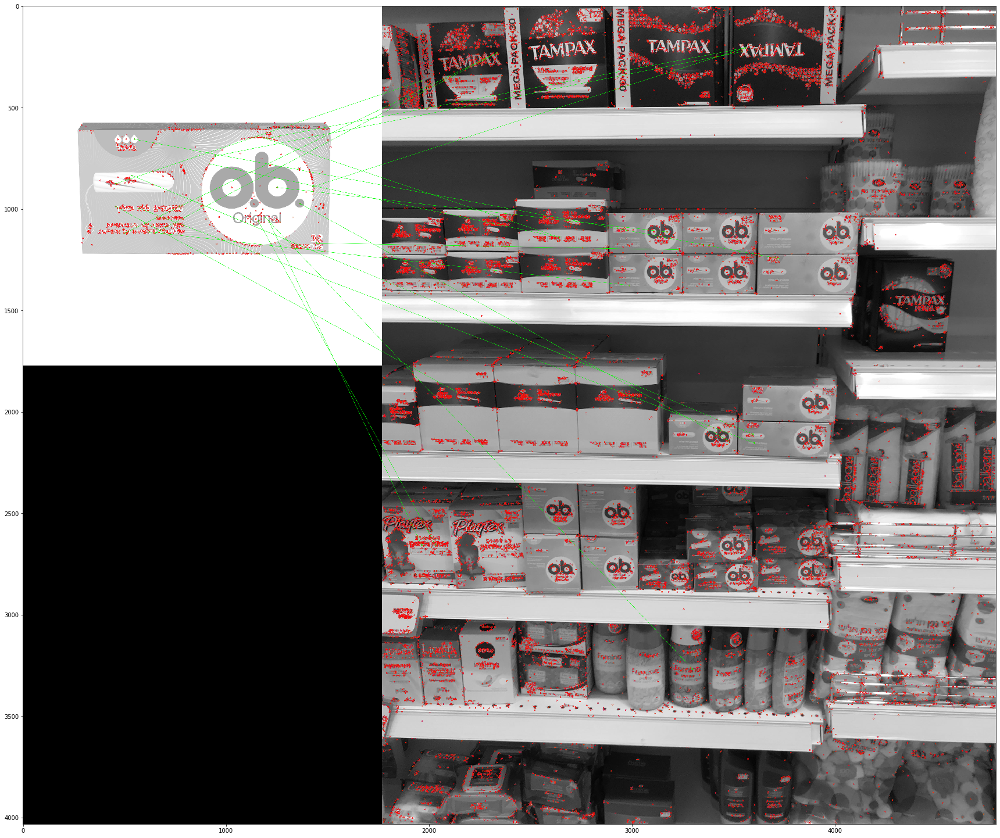

In [14]:
plt.imshow(output, cmap='gray')
print('Number of matches: ', matches_num)

## And now let's reduce the search space with Sliding Window.
After sliding window we will get bounding box, and then apply FLANN Matcher for each box.
Then define threshold number, and if the number of matches pass the threshold number i will sign that box as "successful box".

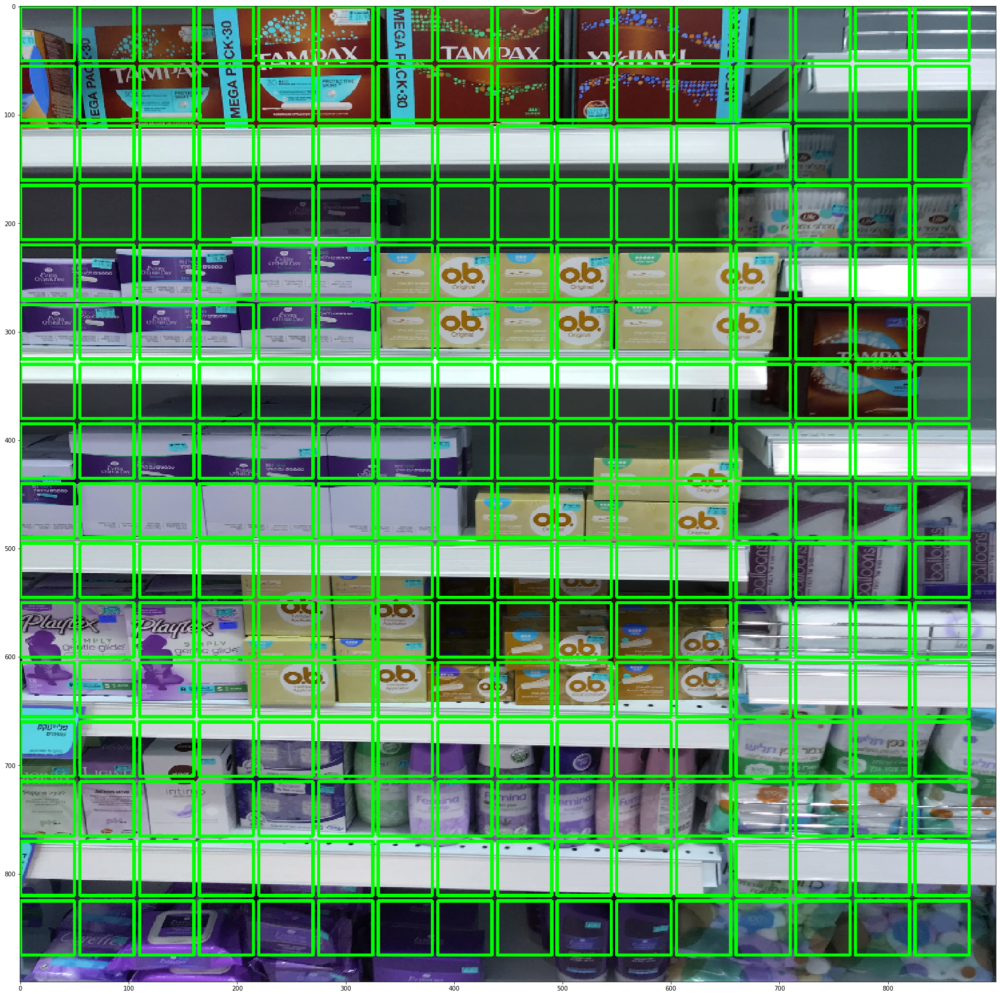

In [15]:
shelf = cv2.imread('dataset/shelfs/7.jpg')
shelf = cv2.resize(shelf, (900, 900))

windows = []
windows_info = []

stepSize = 55
(width, height) = (50, 50) # window size
for x in range(0, shelf.shape[1] - width + 1 , stepSize):
    for y in range(0, shelf.shape[0] - height + 1 , stepSize ):
        window = shelf[x:x + width, y:y + height, :]
        windows.append(window)
        windows_info.append((x, y, width, height))
        cv2.rectangle(shelf, (x, y), (x + width, y + height), (0, 255, 0), 2)

plt.imshow(np.array(shelf).astype('uint8'))
plt.show()

Note: I use "try except" because the windows might be not include interesting points.

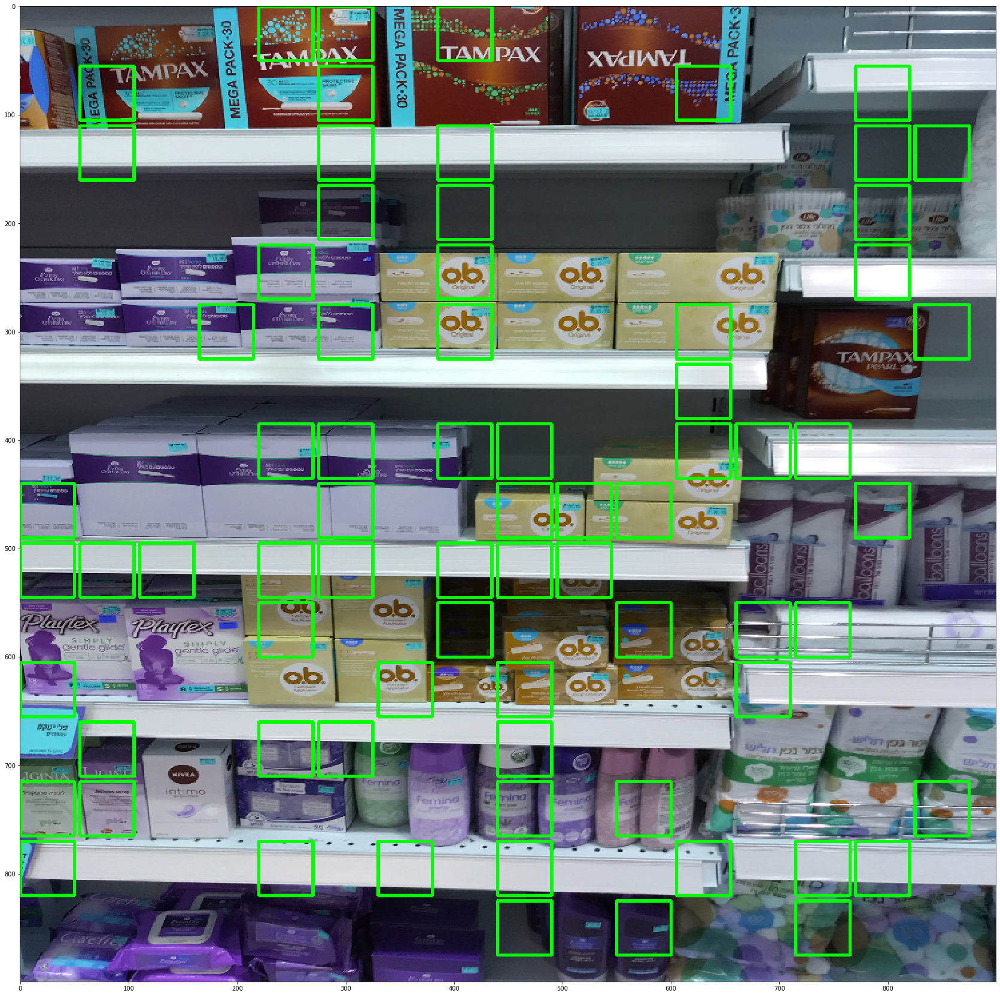

In [16]:
output = cv2.imread('dataset/shelfs/7.jpg')
output = cv2.resize(output, (900, 900))

for i in range(len(windows)):
      
    patche_keypoints, patche_descriptors = sift.detectAndCompute(windows[i], None)
        
    try:
        matches = flann.knnMatch(ob_descriptors, patche_descriptors, k=2)
    except:
        continue
      
    matches_num = 0
    for j,(m,n) in enumerate(matches):
        if m.distance < 0.55*n.distance:   
            matches_num = matches_num + 1            
    
    if matches_num >= 3:
        x, y, w, h  = windows_info[i]
        cv2.rectangle(output, (x, y), (x+w, y+h), (0, 255, 0), 2)
        
plt.imshow(output) 

 ## The same idea but now with  Selective Search.
After Selective Search we will get bounding boxs, and then apply FLANN Matcher for each box.
Then define threshold number, and if the number of matches pass the threshold number i will sign that box as "successful box".

NOTE: I have to reduce the image resolution because using CPU.

In [17]:
import sys

def selective_search(im):

    cv2.setUseOptimized(True)
    cv2.setNumThreads(8)
    
    patches_list = []
    patche_info = []

    im = cv2.resize(im, (900, 900))    
    # create Selective Search Segmentation Object using default parameters
    ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()

    ss.setBaseImage(im) 
    ss.switchToSelectiveSearchFast()
    
    rects = ss.process()
    print('Total Number of Region Proposals: {}'.format(len(rects)))
        
   
    imOut = im.copy()
    
    for i, rect in enumerate(rects):
        
        x, y, w, h = rect
        cv2.rectangle(imOut, (x, y), (x+w, y+h), (0, 255, 0), 1, cv2.LINE_AA)
        # crop and save bounding boxs and there coordinates
        patche_info.append((x, y, w, h))
        patches_list.append(im[y:y+h, x:x+w])
        
    return (imOut, patches_list, patche_info)

In [18]:
bounding_box, patches, patche_info = selective_search(shelfs_color)

Total Number of Region Proposals: 9031


Let's take a look... 

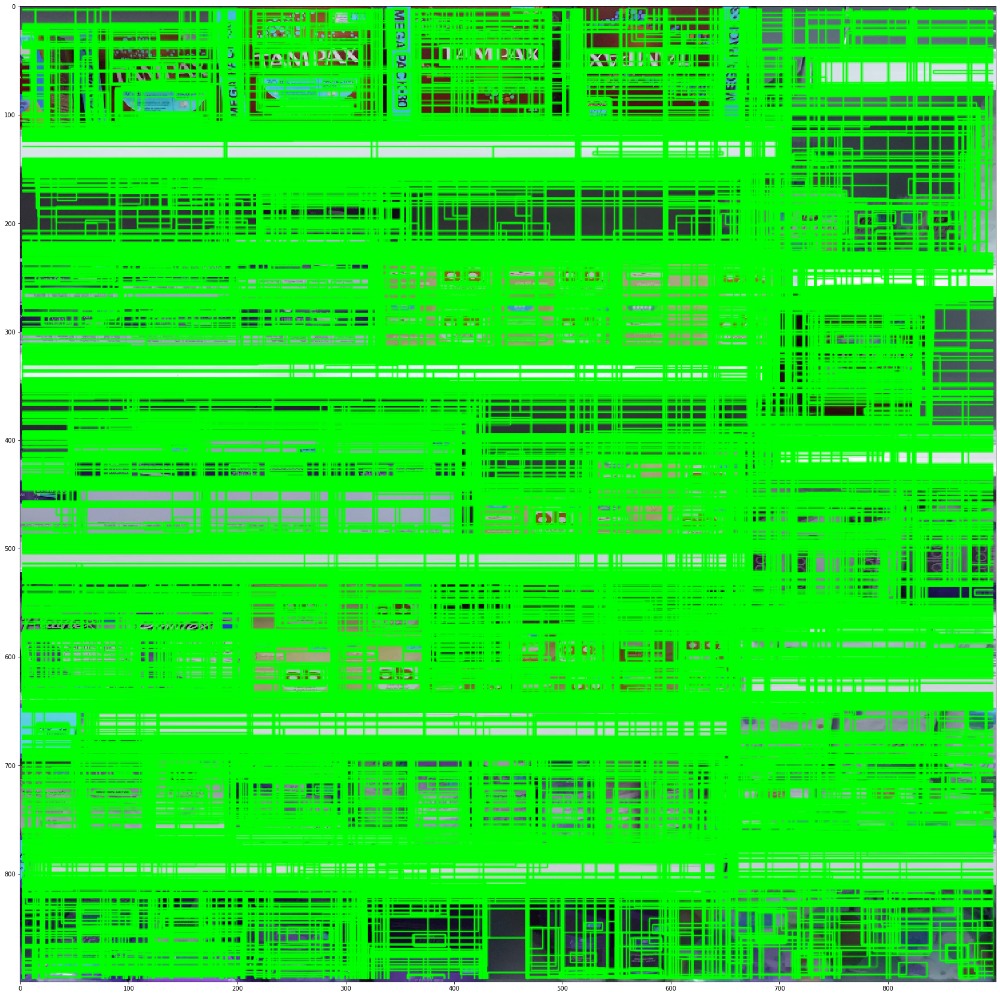

In [19]:
rcParams['figure.figsize'] = 30, 30
plt.imshow(bounding_box)

Save only the patches with "Normal" size.

There is 86 region proposals in "Normal" size.
20 samples from 86 region proposals:


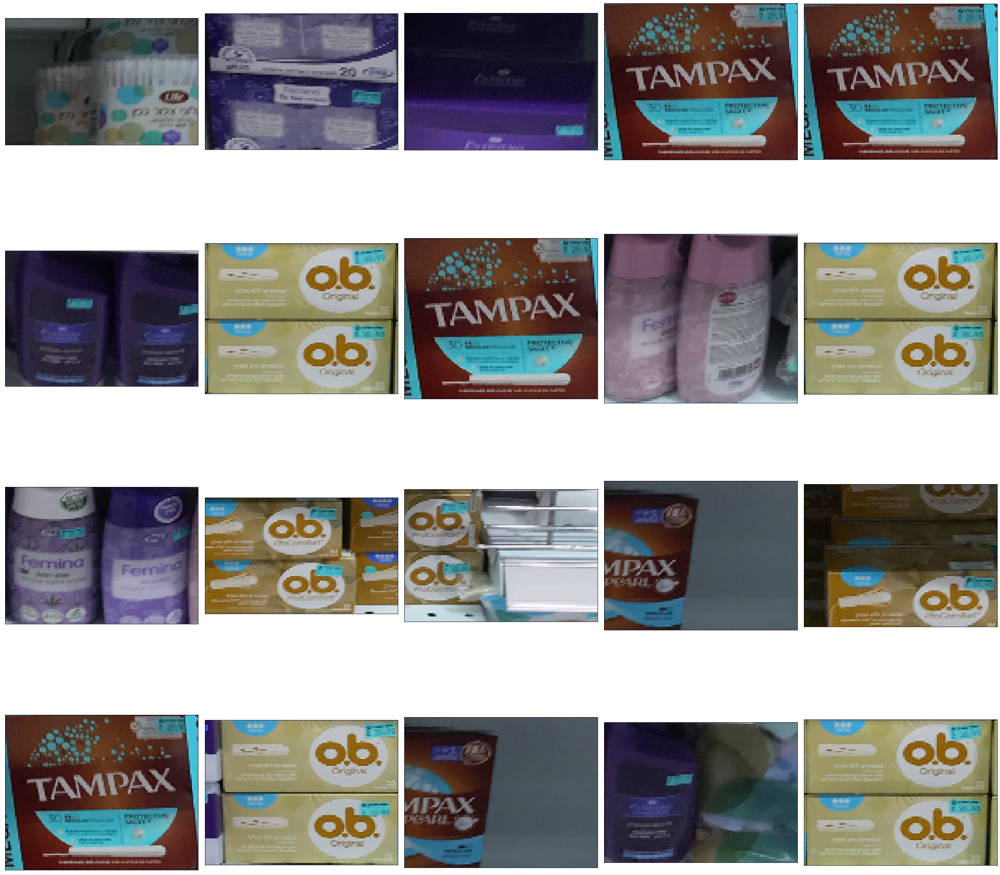

In [20]:
shelfs_color = cv2.imread('dataset/shelfs/7.jpg')

final_p = []
final_patche_info = []

for i in range(len(patches)):   
    if (patches[i].shape[0] > 70 and patches[i].shape[0] < 100) and (patches[i].shape[1] < 120 and patches[i].shape[1] > 100):
        final_p.append(patches[i])
        final_patche_info.append(patche_info[i])
print('There is', len(final_p), 'region proposals in "Normal" size.')


for i in range(20):    
    plt.subplot(4, 5, i+1)
    plt.imshow(final_p[i], cmap='gray')
    plt.xticks([])
    plt.yticks([])

print('20 samples from', len(final_p), 'region proposals:')
plt.tight_layout()
plt.show()

Apply FLANN Matcher for each patche

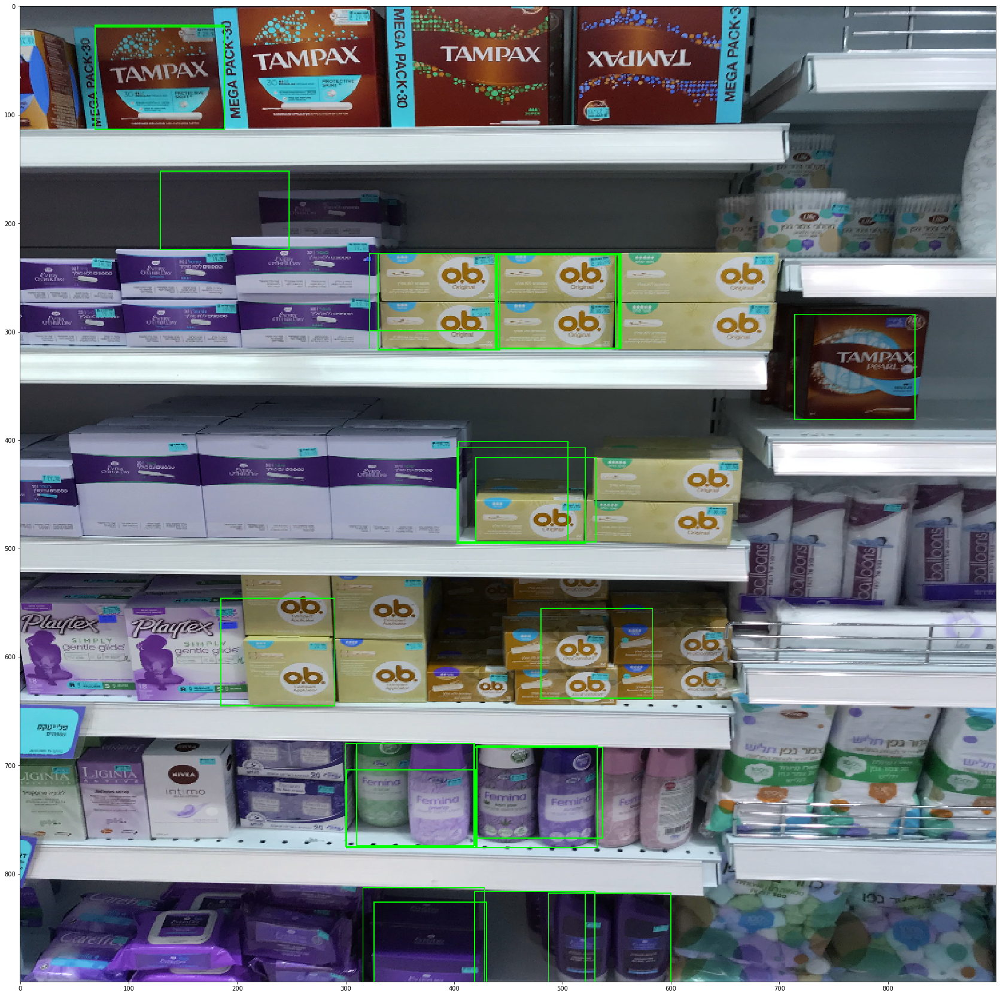

In [21]:
shelfs_color = cv2.imread('dataset/shelfs/7.jpg')
shelfs_color = cv2.resize(shelfs_color, (900, 900))
for i in range(len(final_p)):
      
    patche_keypoints, patche_descriptors = sift.detectAndCompute(final_p[i], None)
    
    try:
        matches = flann.knnMatch(ob_descriptors, patche_descriptors, k=2)
    except:
        continue
        
    matches_num = 0
    for j,(m,n) in enumerate(matches):
        if m.distance < 0.55*n.distance:   
            matches_num = matches_num + 1            

        #print(matches_num)
        if matches_num >= 3:
            x, y, w, h  = final_patche_info[i]         
            cv2.rectangle(shelfs_color, (x, y), (x+w, y+h), (0, 255, 0), 1)
        
         
plt.imshow(shelfs_color)

In [22]:
shelfs_4 = cv2.imread('dataset/shelfs/4.jpg')
shelfs_4 = cv2.resize(shelfs_4, (900, 900))

bounding_box, patches, patche_info = selective_search(shelfs_4)

Total Number of Region Proposals: 8021


There is 80 region proposals in "Normal" size.


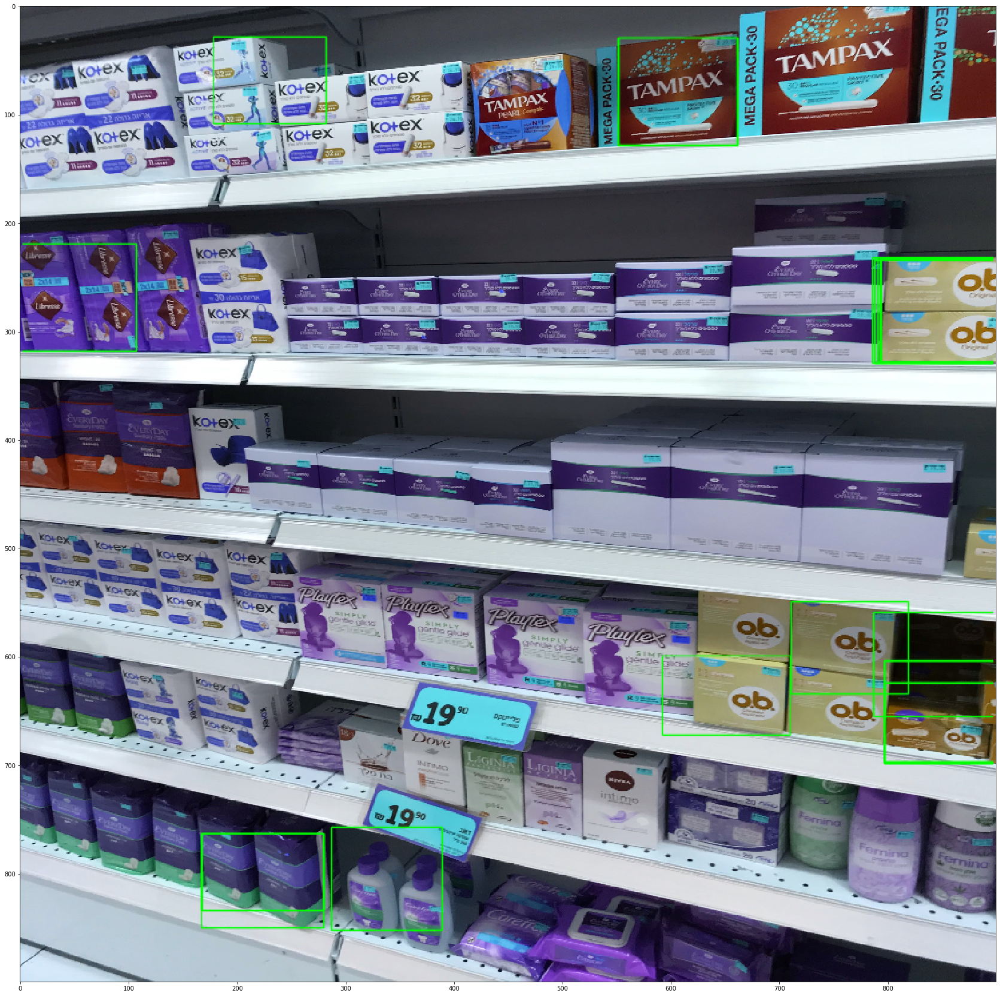

In [23]:
final_p = []
final_patche_info = []

for i in range(len(patches)):   
    if (patches[i].shape[0] > 70 and patches[i].shape[0] < 100) and (patches[i].shape[1] < 120 and patches[i].shape[1] > 100):
        final_p.append(patches[i])
        final_patche_info.append(patche_info[i])
print('There is', len(final_p), 'region proposals in "Normal" size.')


for i in range(len(final_p)):
      
    patche_keypoints, patche_descriptors = sift.detectAndCompute(final_p[i], None)
    
    try:
        matches = flann.knnMatch(ob_descriptors, patche_descriptors, k=2)
    except:
        continue
        
    matches_num = 0
    for j,(m,n) in enumerate(matches):
        if m.distance < 0.55*n.distance:   
            matches_num = matches_num + 1            
    
    #print(matches_num)
    if matches_num >= 3:
        x, y, w, h  = final_patche_info[i]         
        cv2.rectangle(shelfs_4, (x, y), (x+w, y+h), (0, 255, 0), 1, cv2.LINE_AA)
        
         
plt.imshow(shelfs_4)
